In [1]:
import sys
import os
import pandas as pd
import importlib
sys.path.append('utils')
sys.setrecursionlimit(3000)
import utils_chem
importlib.reload(utils_chem)
import utils_common
importlib.reload(utils_common)
from rdkit import Chem
import numpy as np
import utils_interaction
importlib.reload(utils_interaction)
import extr_core_info
importlib.reload(extr_core_info)
import random
import warnings
import pickle
import dual_MCTS
importlib.reload(dual_MCTS)
warnings.filterwarnings('ignore')

csv_dhodh='data/inputs/active_ligands/dhodh/dhodh.csv'
dir_dhodh='data/outputs/docking/dhodh/act_pdbs_comp'
conformer_dir_dhodh='data/outputs/docking/dhodh/act_pdbs_pose'
csv_rorgt='data/inputs/active_ligands/rorgt/part.csv'
dir_rorgt='data/outputs/docking/rorgt/act_pdbs_comp'
conformer_dir_rorgt='data/outputs/docking/rorgt/act_pdbs_pose'

def get_draw_mol(core_info):
    mol_list=[]
    score_list=[]
    count_list=[]
    act_mol_list=[]
    name_list=[]
    new_core_info={}
    for smiles in core_info:
        if len(core_info[smiles]['act_mols'])>=10:
            mol_list.append(Chem.MolFromSmiles(smiles))
            score_list.append(np.sum(core_info[smiles]['scores']))
            count_list.append(len(core_info[smiles]['act_mols']))
            tmp_list=[]
            print(smiles,end=',')
            for act_mol in core_info[smiles]['act_mols'][:11]:
                print(Chem.MolToSmiles(act_mol),end=',')
                tmp_list.append(Chem.MolFromSmiles(Chem.MolToSmiles(act_mol)))
            while len(tmp_list)<11:
                tmp_list.append(None)
            act_mol_list.extend(tmp_list)
            print()
            tmp_list=random.sample(core_info[smiles]['name'],min(11,len(core_info[smiles]['name'])))
            while len(tmp_list)<11:
                tmp_list.append(None)
            name_list.extend(tmp_list)
            new_core_info[smiles]=core_info[smiles]

    arg_idx=np.argsort(count_list)[::-1]
    count_list=[count_list[i] for i in arg_idx]
    mol_list=[mol_list[i] for i in arg_idx]
    temp_act_mol_list=[]
    for i in arg_idx:
        temp_act_mol_list.extend(act_mol_list[11*i:11*(i+1)])
    temp_name_list=[]
    for i in arg_idx:
        temp_name_list.extend(name_list[11*i:11*(i+1)])

    num=np.sum(np.array(count_list)>=10)
    print(sum(count_list[:num]),sum(count_list),num,len(count_list))
    print(count_list)
    final_list=[]
    for i in range(num):
        final_list.append(mol_list[i])
        final_list.extend(temp_act_mol_list[11*i:11*(i+1)])
        print(temp_name_list[11*i:11*(i+1)])
    return final_list,new_core_info
    


/home/chensheng/anaconda3/envs/mtdd/lib/python3.8/site-packages/molsets-1.0-py3.8.egg/moses/metrics/utils.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  _mcf.append(_pains, sort=True)['smarts'].values]


In [2]:
core_info_dhodh=utils_interaction.get_infos(csv_dhodh,5773,dir_dhodh,conformer_dir_dhodh,lig_identifier='UNK:Z:900',
                                            contact_res=set([47,356]),reserved_inter=set(['hbond']),score_thrh=1,ncpu=64)



In [6]:
final_list,core_info_dhodh=get_draw_mol(core_info_dhodh)
with open('data/temp_data/core_info_dhodh.pkl','wb') as w:
    pickle.dump(core_info_dhodh,w)

675 675 22 22
[153, 145, 57, 30, 27, 24, 23, 21, 21, 20, 19, 19, 14, 13, 13, 12, 12, 11, 11, 10, 10, 10]
['1020450', '1020665', '1020534', '1020565', '1020415', '1020679', '1020441', '1020443', '1020417', '1020436', '1020542']
['1226074', '1098801', '1226075', '1226065', '1226058', '1226043', '1226087', '1226036', '1225996', '1226006', '1226073']
['972666', '972487', '1098649', '1098650', '1098824', '1098817', '1098655', '1098624', '1098825', '1098636', '1098700']
['51334961', '51334967', '51334955', '51334963', '993082', '993092', '993098', '51334945', '993121', '51334943', '993074']
['1020602', '1020603', '1020576', '1020601', '1020573', '1020578', '1020599', '1020595', '1020588', '1020582', '1020580']
['50319898', '50319875', '28076', '50319903', '50251718', '50251727', '50251725', '50251721', '50251729', '50251726', '50251720']
['297813', '297848', '297791', '297765', '297771', '297836', '297819', '297842', '50358207', '297818', '297776']
['51390146', '1045588', '1045587', '1045609

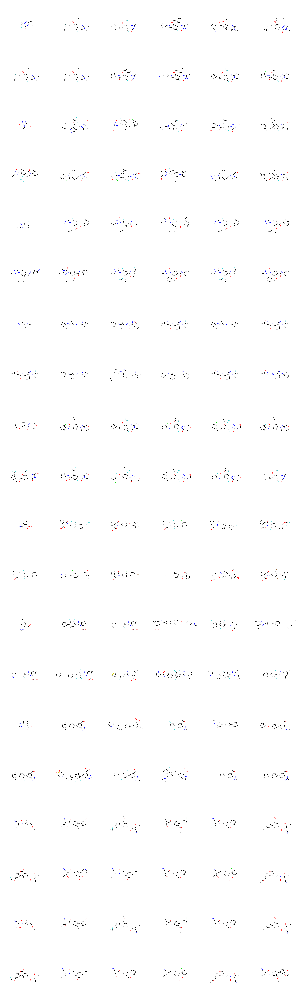

In [11]:
Chem.Draw.MolsToGridImage(final_list,molsPerRow=6,subImgSize=(600,600),maxMols=120)

In [3]:
core_info_rorgt=utils_interaction.get_infos(csv_rorgt,3865,dir_rorgt,conformer_dir_rorgt,lig_identifier='UNK:Z:900',
                                            contact_res=set([479]),reject_res=set([287,323,367]),reserved_inter=set(),score_thrh=1
                                            ,ncpu=64)


(728444, 13.931646332144737, (<rdkit.Chem.rdchem.Mol object at 0x7f7a145fc400>, 'CC(C(=O)N1CCCCC1)C(C)(C)C', <rdkit.Chem.rdchem.Mol object at 0x7f7a10e324c0>, (<rdkit.Chem.rdchem.Mol object at 0x7f7a11335eb0>,), -8.55284196865778, {15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28}), {'contact_479'}, {15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28})
(728444, 9.679901871739364, (<rdkit.Chem.rdchem.Mol object at 0x7f7a10e329a0>, 'CC(C(=O)N1CCC(c2cn(C)c3ncc(N)c(C(F)(F)F)c23)CC1)C(C)(C)C', <rdkit.Chem.rdchem.Mol object at 0x7f7a10e323a0>, (<rdkit.Chem.rdchem.Mol object at 0x7f7a113513c0>,), -8.55284196865778, {8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36}), {'hbond_377', 'hydrophobic_317'}, {8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36})
(728444, 1.6708479959790299, (<rdkit.Chem.rdchem.Mol object at 0x7f7a10e32a00>, 'Cn1cc(C2CCN(C=O)CC2)c2c(C(

In [15]:
final_list,core_info_rorgt=get_draw_mol(core_info_rorgt)
# with open('data/temp_data/core_info_rorgt.pkl','wb') as w:
#     pickle.dump(core_info_rorgt,w)

CC(C)(C)NS(=O)(=O)c1cccc2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCC(C)(C)C(N)=O)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NC3CC(C(=O)O)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(O)CNC(=O)c1nc(CC2CCCCC2)[c:12](-[c:12]2ccc(S(=O)(=O)NC(C)(C)C)c3ccccc32)s1,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(-c3nnc(CC(C)(C)C(=O)O)o3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)N3CC4(C3)CS(=O)(=O)C4)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCC3CS(=O)(=O)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(-c3nnc(C(C)(C)O)o3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)N3CC4(CCS(=O)(=O)CC4)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCCN3CCOCC3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(N)=O)nc2CC2CCCCC2)c2ccccc12,Cc1nnc(-c2nc(CC3CCCCC3)[c:12](-[c:12]3ccc(S(=O)(=O)NC(C)(C)C)c4ccccc43)s2)o1,
CCc1ccccc1,CCS(=O)(=O)c1ccc(CC(=O)Nc2cnc([O:2][CH:2](

: 

In [15]:
Chem.Draw.MolsToGridImage(final_list,molsPerRow=6,subImgSize=(600,600),maxMols=240)

In [8]:
dual_MCTS_Agent=dual_MCTS.DualMCTS(core_info_rorgt,core_info_dhodh)
print(dual_MCTS_Agent.sampler1.rationale_count,dual_MCTS_Agent.sampler2.rationale_count)
with open('data/temp_data/dual_MCTS_Agent.pkl','wb') as w:
    pickle.dump(dual_MCTS_Agent,w)

158391 13225


In [2]:
with open('data/temp_data/gsk3b_jnk3/dual_MCTS_Agent_iter_0.pkl','rb') as r:
    dual_MCTS_Agent=pickle.load(r)
print(dual_MCTS_Agent.sampler1.rationale_count,dual_MCTS_Agent.sampler2.rationale_count)

139408 62798


In [3]:
with open('data/temp_data/rorgt_dhodh/dual_MCTS_Agent_iter_0.pkl','rb') as r:
    dual_MCTS_Agent=pickle.load(r)
print(dual_MCTS_Agent.sampler1.rationale_count,dual_MCTS_Agent.sampler2.rationale_count)


158391 13225


In [11]:
with open('data/temp_data/dual_MCTS_Agent.pkl','rb') as r:
    dual_MCTS_Agent=pickle.load(r)

In [17]:
df=dual_MCTS_Agent.init_explore(100)
df.to_csv('tmp.csv',index=False)

 46%|████▌     | 460/1000 [00:00<00:00, 948.76it/s, generated:=100]


got mols
got sa
got qed
got weight
got logp
got tpsa
got hba
got hbd
got rotbond


In [9]:
dual_MCTS_Agent.iter_explore(100)

KeyboardInterrupt: 

In [13]:
result=dual_MCTS_Agent.init_explore(n_sample=100000,max_atoms=50)
smiles_list=[]
title_list=[]
for smiles in zip(result[1]):
    if smiles:
        smiles_list.append(smiles)
        title_list.append(f'init_{len(title_list)}')
df=pd.DataFrame({'SMILES':smiles_list,'Title':title_list})
df.to_csv('init.csv',index=False)

 52%|█████▏    | 521537/1000000 [07:02<06:27, 1235.50it/s, 1=1, generated:=1e+5] 


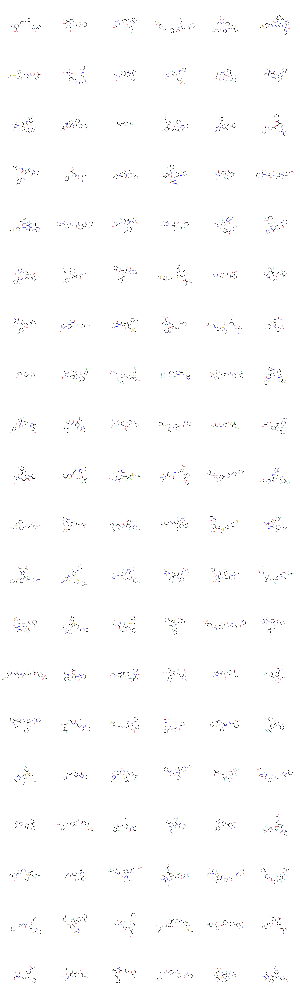

In [25]:
from copy import deepcopy
import random
Chem.Draw.MolsToGridImage(random.sample(result[0],120),molsPerRow=6,subImgSize=(600,600),maxMols=120)